# Imports

In [ ]:
import os, re
from google.colab import drive
drive.mount('/content/drive', force_remount = True)
import scipy.io as so
import numpy as np
import matplotlib.pylab as plt
import pandas as pd

import sys
#change MyDrive to Shared or wherever the files are contained to access PySleep
sys.path.append('/content/drive/MyDrive/Penn/PySleep')
os.chdir('/content/drive/MyDrive/Penn/PySleep')
import sleepy


# Fixed Parameters
nbin = 2500
sr = 1000
#change this file path as well
ppath = '/content/drive/MyDrive/Penn/RawData/Pwaves'


# Key parameters
iwin = 250


Mounted at /content/drive


# Data Preparation

In [ ]:
#Specify which file has all files that need to be processed, 'pwave_files.txt'
train_recordings, test_recordings = sleepy.load_recordings(ppath, 'pwave_files_test.txt')
recordings = test_recordings

recording_map = {}
for rec in test_recordings:
    recording_map[rec] = 'test'

all_test_data = []
all_test_target = []
file_names = []

for name in recordings:
    temp_test_target = []
    temp_test_data = []
    print(name)
    # load brain states
    M = sleepy.load_stateidx(ppath, name)[0]
    # load indices of p-waves
    pwave_dict = so.loadmat(os.path.join(ppath, name, 'p_idx.mat'), squeeze_me=True)
    # channel used for p-wave detection
    lfp_channel = pwave_dict['channel']
    # indices of p-waves
    pidx = pwave_dict['p_idx']

    lfp_name = 'LFP_raw'
    if lfp_channel == '1':
        lfp_name = lfp_name
    else:
        lfp_name = lfp_name + str(lfp_channel)
    # load LFP data:
    try:
        LFP = so.loadmat(os.path.join(ppath, name, lfp_name + '.mat'), squeeze_me=True)[lfp_name]
    except:
        lfp_name = 'LFP'
        LFP = so.loadmat(os.path.join(ppath, name, lfp_name + '.mat'), squeeze_me=True)[lfp_name]

    print('Used LFP channel: %s' % lfp_name)

    # Go through each REM episode, cut out consecutive windows of size 2*iwin and then check whether the window contains a p-wave or not
    # get all REM sleep sequences
    seq = sleepy.get_sequences(np.where(M!=11)[0])

    # go through each REM sleep episode:
    #for s in seq:
    pidx_rem = []

    for s in seq:
        si = s[0]*nbin
        sj = s[-1]*nbin+1
        for a in np.arange(si, sj, iwin):
            # a is the start of an LFP window:
            window = LFP[a:a+iwin]
            temp_test_data.append(window)

            # test if @window contains a P-wave
            hits = np.where((pidx >= a) & (pidx < a+iwin))[0]

            label = 0
            if len(hits) > 0:
                label = 1
            temp_test_target.append(label)
    file_names.append(name)
    temp_test_data = np.array(temp_test_data)
    temp_test_target = np.array(temp_test_target)
    all_test_data.append(temp_test_data)
    all_test_target.append(temp_test_target)


EP031_032923n1
Used LFP channel: LFP_raw2
EP88_101023n1
Used LFP channel: LFP
EP90_101023n1
Used LFP channel: LFP
EP90_101123n1
Used LFP channel: LFP_raw2
EP90_101223n1
Used LFP channel: LFP_raw
EP109_012524n1
Used LFP channel: LFP_raw
EP112_121423n1
Used LFP channel: LFP_raw
EP112_121523n1
Used LFP channel: LFP_raw
EP113_121423n1
Used LFP channel: LFP_raw2
EP113_121523n1
Used LFP channel: LFP_raw2
EP114_121423n1
Used LFP channel: LFP_raw
EP114_121523n1
Used LFP channel: LFP_raw
EP115_010324n1
Used LFP channel: LFP_raw2
EP030_032923n1
Used LFP channel: LFP_raw
EP132_022124n1
Used LFP channel: LFP_raw
EP159_051024n1
Used LFP channel: LFP_raw2
EP116_122023n1
Used LFP channel: LFP_raw
EP118_122023n1
Used LFP channel: LFP_raw
EP117_122023n1
Used LFP channel: LFP_raw2


# CNN Model

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split

test_loaders = []
for i in range(len(all_test_data)):
    test_data = all_test_data[i]
    test_target = all_test_target[i]
    X_test_tensor = torch.tensor(test_data, dtype=torch.float32)
    X_test_tensor = X_test_tensor.unsqueeze(1)
    y_test_tensor = torch.tensor(test_target, dtype=torch.float32).view(-1, 1)
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
    test_loaders.append(test_loader)


In [ ]:
# Define the CNN model
class PWaveDetectorCNN(nn.Module):
    def __init__(self, kernel_size=5, input_size=60, num_channels=1):
        super(PWaveDetectorCNN, self).__init__()

        dropout_prob_conv = 0.3
        dropout_prob_fc = 0.5

        kernel_size = 3
        num_filters = 32
        self.conv1 = nn.Conv1d(in_channels=num_channels, out_channels=32, kernel_size=kernel_size)
        self.pool = nn.MaxPool1d(kernel_size=2)
        self.dropout1 = nn.Dropout(dropout_prob_conv)

        self.conv2 = nn.Conv1d(in_channels=32, out_channels=64, kernel_size=kernel_size)
        self.pool2 = nn.MaxPool1d(kernel_size=2)
        self.dropout2 = nn.Dropout(dropout_prob_conv)

        self.flatten = nn.Flatten()


        # Calculate the size of the feature map after the conv and pool layers
        n = input_size
        n = (n - kernel_size + 1) // 2  # After conv1 and pool1
        n = (n - kernel_size + 1) // 2  # After conv2 and pool2

        self.fc1 = nn.Linear(64 * int(n), 64)  # 128 filters, each reduced to length 22 after conv and pooling
        self.dropout_fc1 = nn.Dropout(dropout_prob_fc) #dropout probability of 0.5
        self.fc2 = nn.Linear(64, 1)
        self.sigmoid = nn.Sigmoid()
        self.dropout = nn.Dropout(p = 0.5)

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.dropout1(x)
        x = self.pool(torch.relu(self.conv2(x)))
        x = self.dropout2(x)
        x = self.flatten(x)
        x = torch.relu(self.fc1(x))
        self.dropout_fc1(x)
        x = self.sigmoid(self.fc2(x))
        return x

# Instantiate the model, define the loss function and the optimizer
model = PWaveDetectorCNN(input_size=iwin, kernel_size=9)
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [ ]:
# Load the best model
file_path = os.path.join(ppath, 'cnn_pwave_extended.pth')
model.load_state_dict(torch.load(file_path))
model.eval()

all_predictions = []

for i in range(len(test_loaders)):
    test_loader = test_loaders[i]
    name = file_names[i]
    test_loss = 0.0
    predictions = []
    true_labels = []
    test_array = []

    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            test_array.append(loss.item())
            test_loss += loss.item() * X_batch.size(0)

            binary_predictions = (outputs.squeeze() > 0.5).float()
            if binary_predictions.dim() == 0:
                predictions.append(binary_predictions.item())
            else:
                predictions.extend(binary_predictions.tolist())

            y = [y[0].item() for y in y_batch]
            true_labels.extend(y)

    test_loss /= len(test_loader.dataset)
    predictions = np.array(predictions)
    true_labels = np.array(true_labels)
    all_predictions.append(predictions)
    print(name + ':')
    print(f'Test Loss: {test_loss:.4f}')
    print(f'Average Prediction Accuracy: {np.sum(predictions == true_labels) / len(predictions):.4f}')
    print()


EP031_032923n1:
Test Loss: 0.8153
Average Prediction Accuracy: 0.7449

EP88_101023n1:
Test Loss: 0.2805
Average Prediction Accuracy: 0.9295

EP90_101023n1:
Test Loss: 1.0776
Average Prediction Accuracy: 0.8367

EP90_101123n1:
Test Loss: 0.5888
Average Prediction Accuracy: 0.8544

EP90_101223n1:
Test Loss: 2.1323
Average Prediction Accuracy: 0.7812

EP109_012524n1:
Test Loss: 0.3495
Average Prediction Accuracy: 0.8861

EP112_121423n1:
Test Loss: 0.4026
Average Prediction Accuracy: 0.8854

EP112_121523n1:
Test Loss: 0.3995
Average Prediction Accuracy: 0.8943

EP113_121423n1:
Test Loss: 0.5220
Average Prediction Accuracy: 0.8869

EP113_121523n1:
Test Loss: 0.3872
Average Prediction Accuracy: 0.8877

EP114_121423n1:
Test Loss: 2.0051
Average Prediction Accuracy: 0.8986

EP114_121523n1:
Test Loss: 0.7248
Average Prediction Accuracy: 0.9608

EP115_010324n1:
Test Loss: 0.3101
Average Prediction Accuracy: 0.9132

EP030_032923n1:
Test Loss: 0.1691
Average Prediction Accuracy: 0.9548

EP132_0221

In [ ]:
def count_within_10ms(predictions, pidx):
    count = 0
    i, j = 0, 0
    n, m = len(predictions), len(pidx)

    while i < n and j < m:
        if abs(predictions[i] - pidx[j]) <= 10:
            count += 1
            i += 1
            j += 1
        elif predictions[i] < pidx[j]:
            i += 1
        else:
            j += 1

    return count


def calculate_tp_fp_fn(predictions, pidx):
    tp = 0
    fp = 0
    fn = 0

    # Step 1: True Positives and False Positives
    i, j = 0, 0
    matched_pidx = set()

    while i < len(predictions) and j < len(pidx):
        if abs(predictions[i] - pidx[j]) <= 10:
            tp += 1
            matched_pidx.add(j)
            i += 1
            j += 1
        elif predictions[i] < pidx[j]:
            i += 1
        else:
            j += 1

    # Any remaining predictions are false positives
    fp = len(predictions) - tp

    # Step 2: False Negatives
    fn = len(pidx) - len(matched_pidx)

    return tp, fp, fn

def calculate_accuracy(predictions, pidx):
    tp, fp, fn = calculate_tp_fp_fn(predictions, pidx)
    total = tp + fp + fn
    if total == 0:
        return 0
    accuracy = tp / total
    return accuracy

In [ ]:
all_pidx_gen = []
for i in range(len(test_loaders)):
    #generates pidx within test_data
    predictions = all_predictions[i]
    test_data = all_test_data[i]
    name = file_names[i]

    pidx_gen = []

    for i in range(len(predictions)):
        if predictions[i] == 1:
          test_window = test_data[i]
          num = iwin * i
          minpos = np.argmin(test_window)
          pidx_gen.append(num + minpos)

    pidx_gen = np.array(pidx_gen)
    all_pidx_gen.append(pidx_gen)

    pwave_dict = so.loadmat(os.path.join(ppath, name, 'p_idx.mat'), squeeze_me=True)
    pidx = pwave_dict['p_idx']
    total = 0
    k = 0
    for i in range(len(pidx_gen)):
      while k < len(pidx) and pidx[k] <= pidx_gen[i] + 10:
        k += 1
      if k > 0:
        temp = pidx[k - 1]
        if temp > pidx_gen[i] - 10:
          total += 1

    total /= len(pidx_gen)

    #write to file
    pwave_dict['p_idx'] = pidx_gen
    so.savemat(os.path.join(ppath, name, 'p_idx_cnn.mat'), pwave_dict)

    M = sleepy.load_stateidx(ppath, name)[0]
    seq = sleepy.get_sequences(np.where(M == 1)[0])

    # go through each REM sleep episode:
    #for s in seq:
    pidx_rem = []
    all_hits = []

    for s in seq:
      si = s[0]*nbin
      sj = s[-1]*nbin+1
      hits = np.where((pidx_gen >= si) & (pidx_gen < sj))[0]
      indices = [pidx_gen[i] for i in hits]
      all_hits.extend(indices)

    within_10 = count_within_10ms(pidx_gen, pidx)
    within_10 /= len(pidx_gen)

    rem_within_10 = count_within_10ms(all_hits, pidx)
    rem_within_10 /= len(all_hits)


    # Print the results
    print(name + ':')
    print(f'Accuracy of predicted p-waves within 10ms: {within_10:.4f}')
    calc_acc = calculate_accuracy(pidx_gen, pidx)
    print(f'Calculated accuracy of predicted p-waves: {calc_acc:.4f}')
    print('REM only:')
    print(f'Accuracy of predicted p-waves within 10ms: {rem_within_10:.4f}')
    calc_acc_rem = calculate_accuracy(all_hits, pidx)
    print(f'Calculated accuracy of predicted p-waves: {calc_acc_rem:.4f}')
    print()
    print(name + " saved")

EP031_032923n1:
Accuracy of predicted p-waves within 10ms: 0.1130
Calculated accuracy of predicted p-waves: 0.1114
REM only:
Accuracy of predicted p-waves within 10ms: 0.3278
Calculated accuracy of predicted p-waves: 0.1243

EP031_032923n1 saved
EP88_101023n1:
Accuracy of predicted p-waves within 10ms: 0.3617
Calculated accuracy of predicted p-waves: 0.2234
REM only:
Accuracy of predicted p-waves within 10ms: 0.7378
Calculated accuracy of predicted p-waves: 0.0259

EP88_101023n1 saved
EP90_101023n1:
Accuracy of predicted p-waves within 10ms: 0.1501
Calculated accuracy of predicted p-waves: 0.1388
REM only:
Accuracy of predicted p-waves within 10ms: 0.4391
Calculated accuracy of predicted p-waves: 0.1045

EP90_101023n1 saved
EP90_101123n1:
Accuracy of predicted p-waves within 10ms: 0.2015
Calculated accuracy of predicted p-waves: 0.1851
REM only:
Accuracy of predicted p-waves within 10ms: 0.4769
Calculated accuracy of predicted p-waves: 0.1542

EP90_101123n1 saved
EP90_101223n1:
Accurac

EP031_032923n1: Predicted p-waves saved


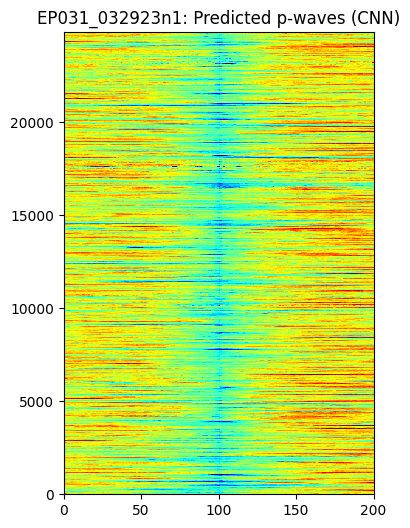

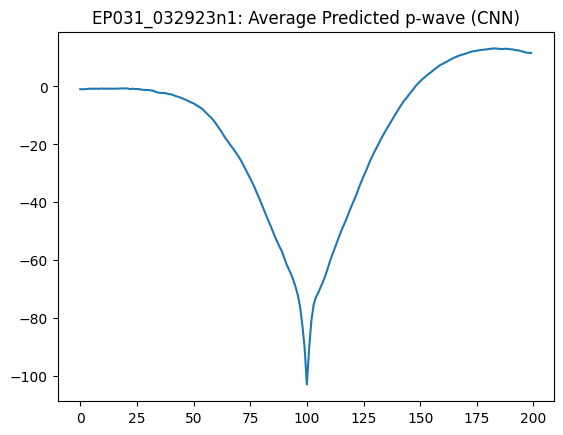

EP88_101023n1: Predicted p-waves saved


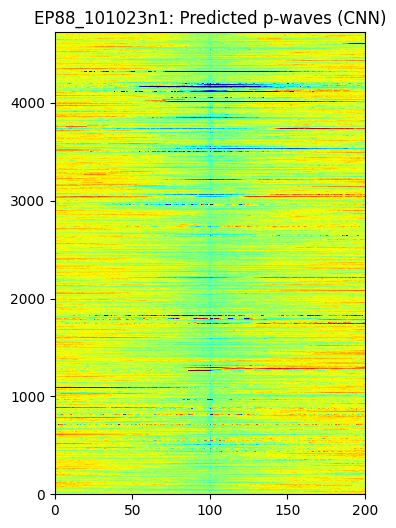

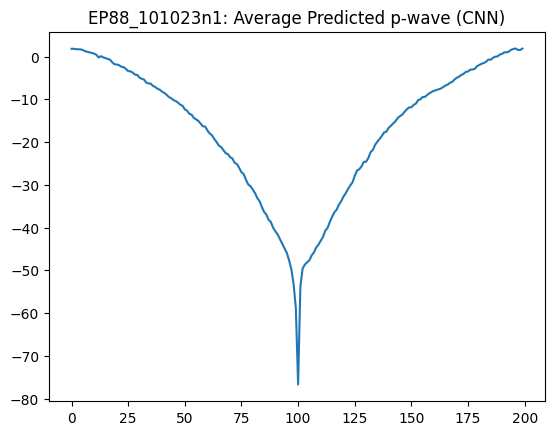

EP90_101023n1: Predicted p-waves saved


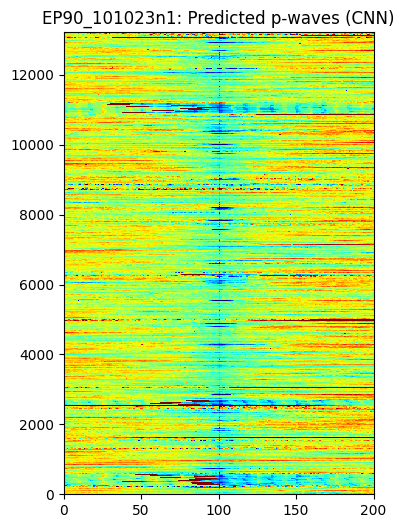

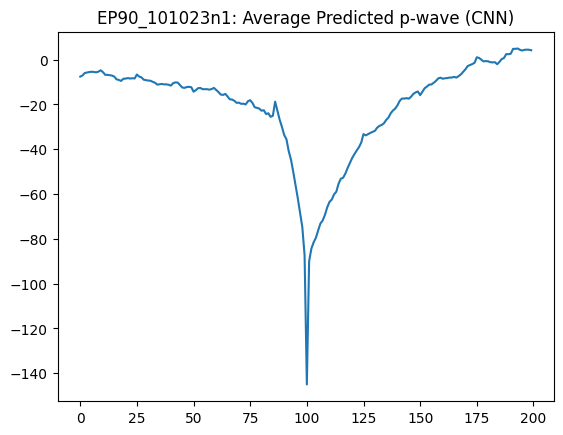

EP90_101123n1: Predicted p-waves saved


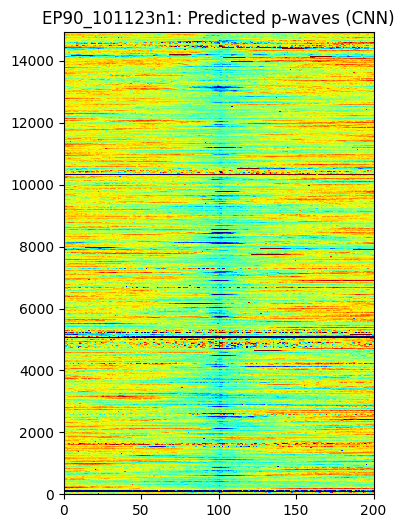

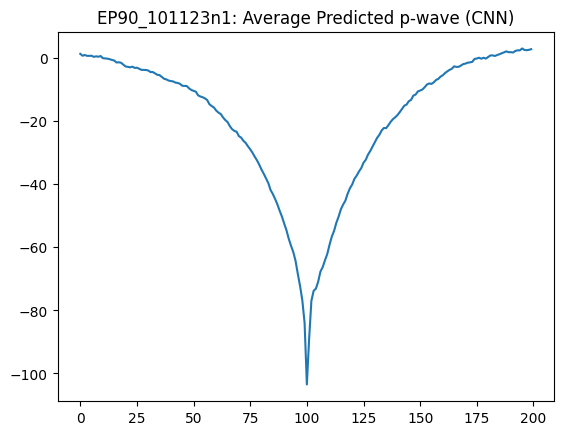

EP90_101223n1: Predicted p-waves saved


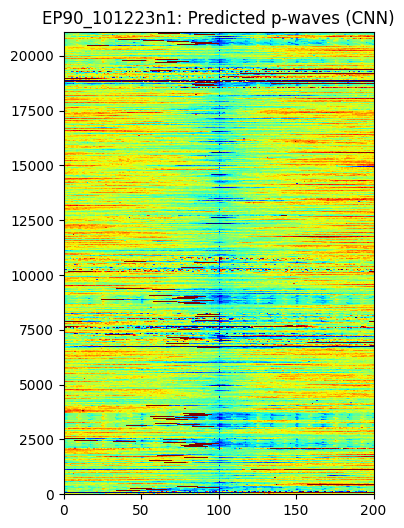

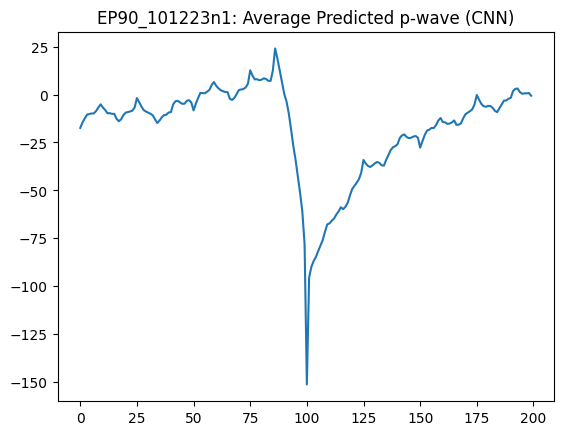

EP109_012524n1: Predicted p-waves saved


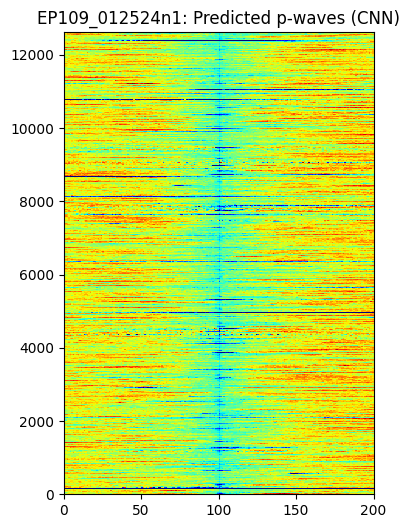

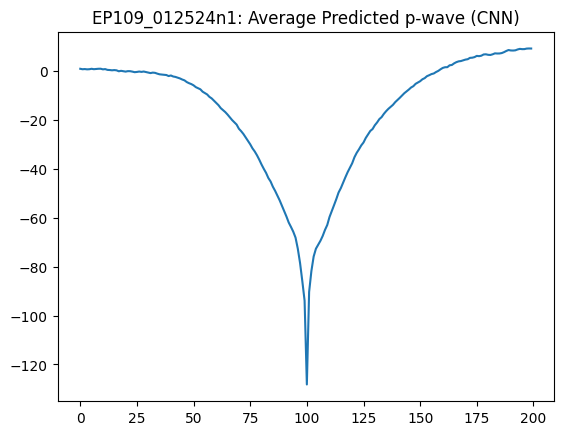

EP112_121423n1: Predicted p-waves saved


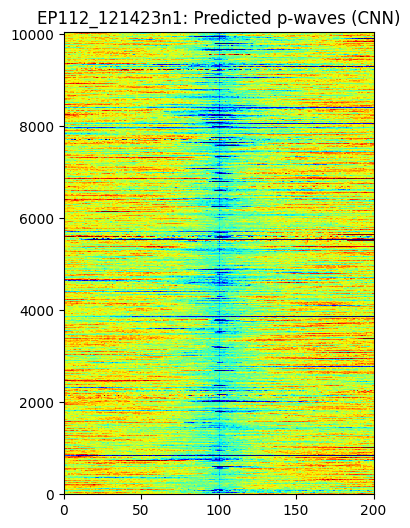

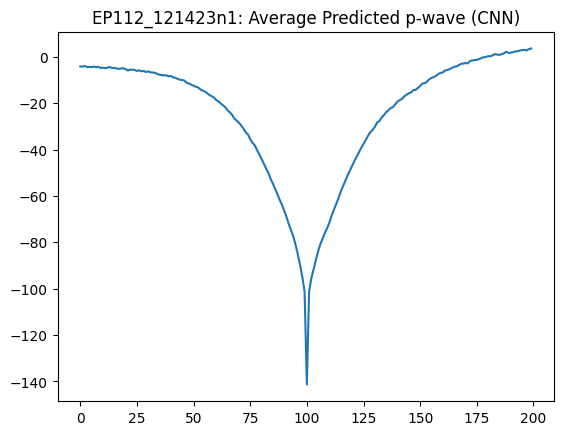

EP112_121523n1: Predicted p-waves saved


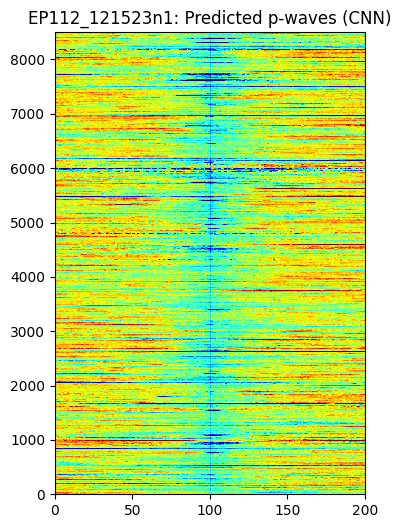

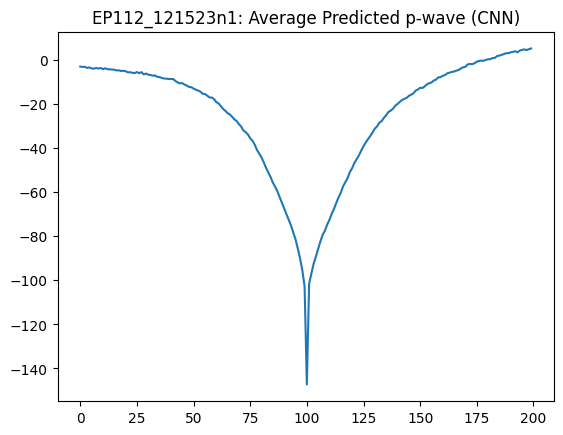

EP113_121423n1: Predicted p-waves saved


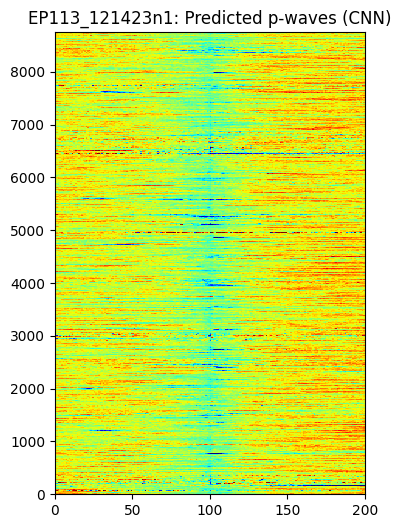

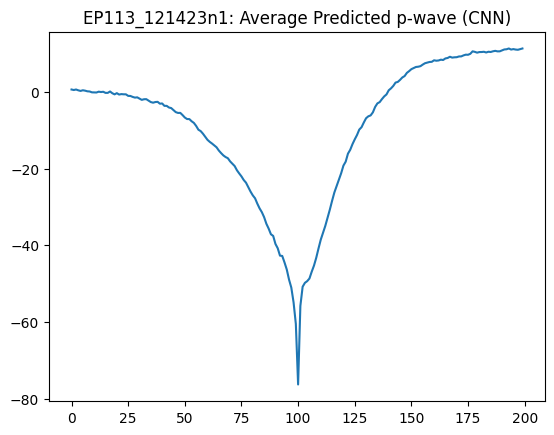

EP113_121523n1: Predicted p-waves saved


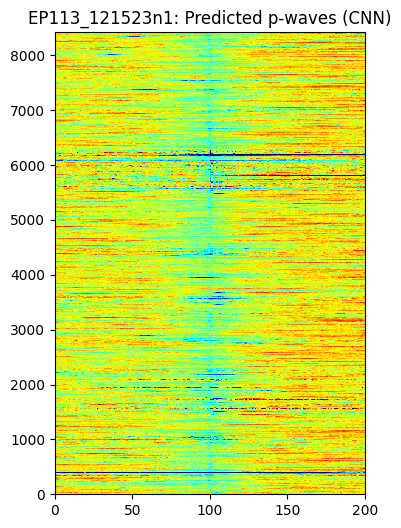

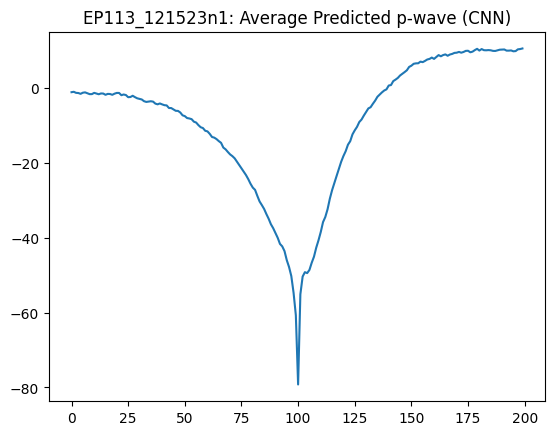

EP114_121423n1: Predicted p-waves saved


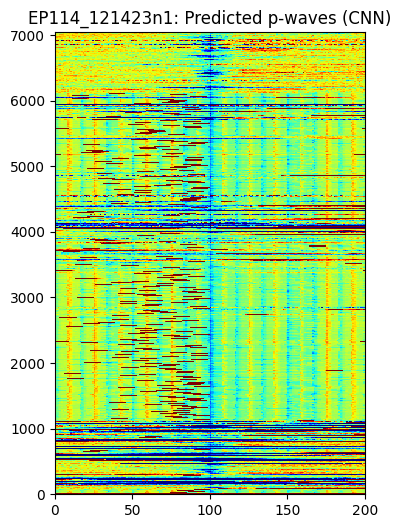

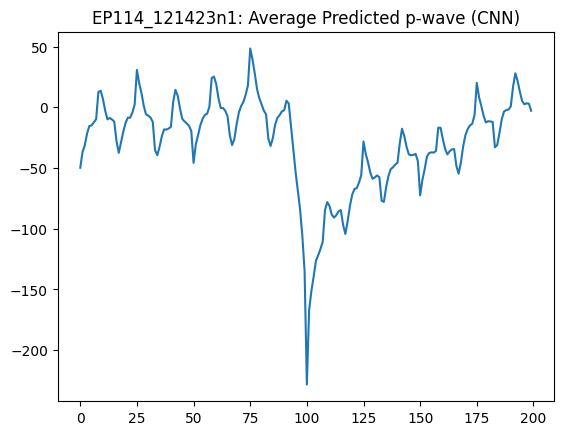

EP114_121523n1: Predicted p-waves saved


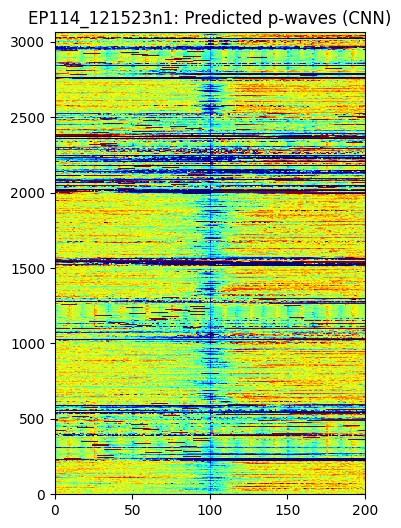

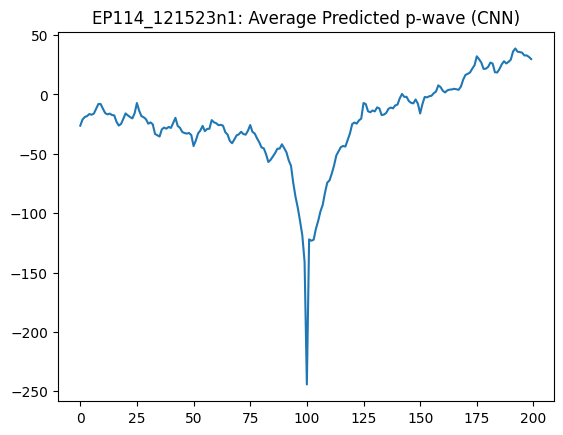

EP115_010324n1: Predicted p-waves saved


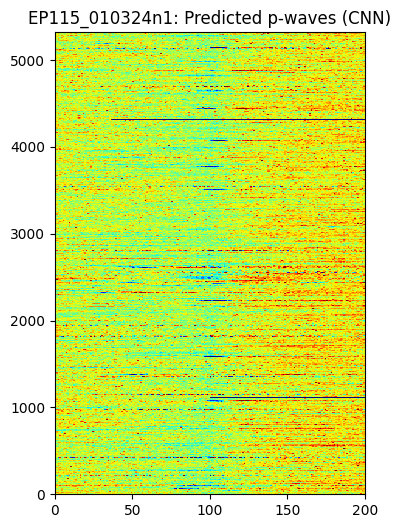

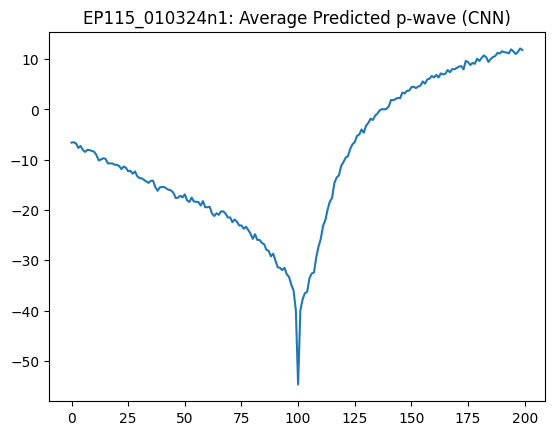

EP030_032923n1: Predicted p-waves saved


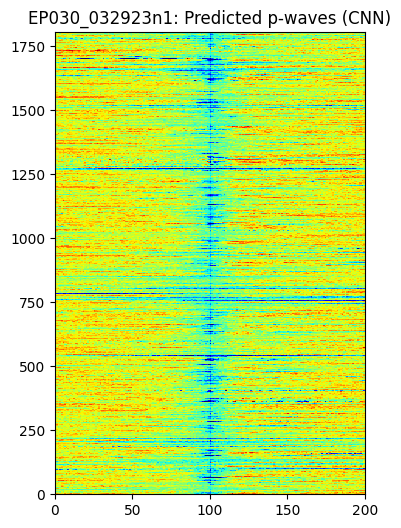

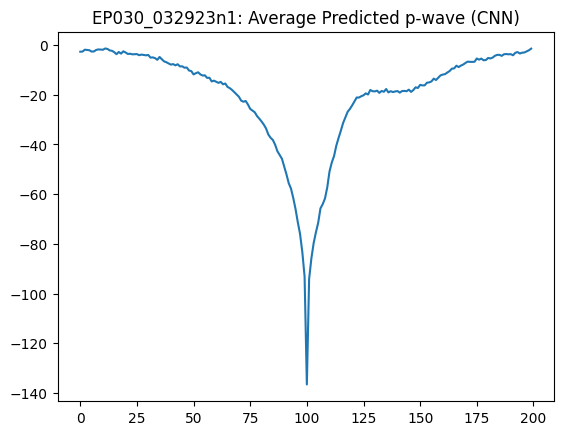

EP132_022124n1: Predicted p-waves saved


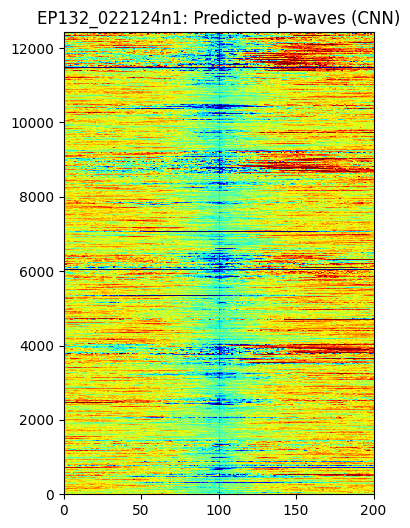

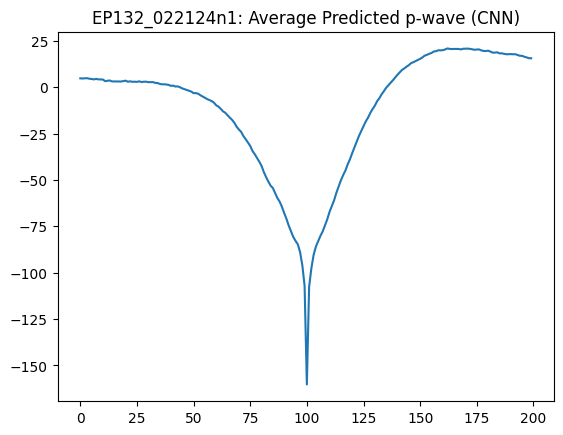

EP159_051024n1: Predicted p-waves saved


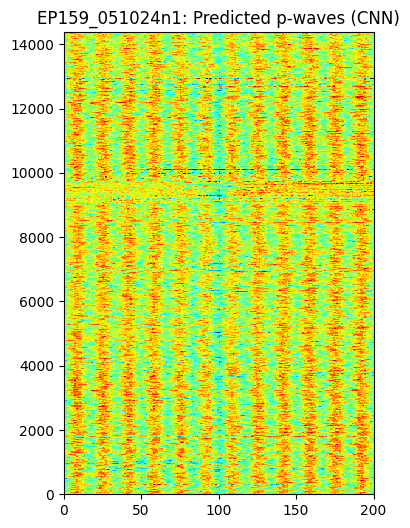

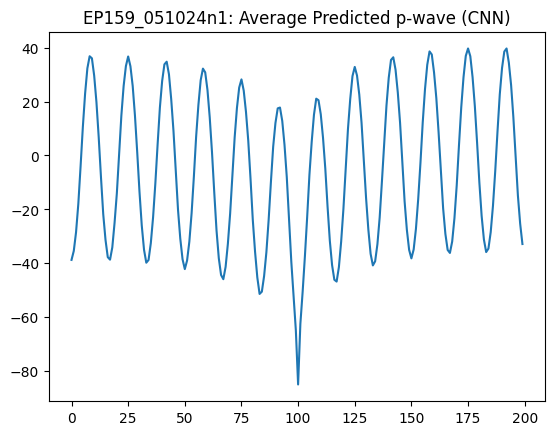

EP116_122023n1: Predicted p-waves saved


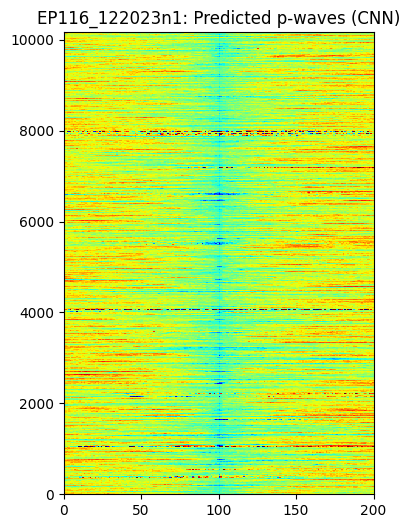

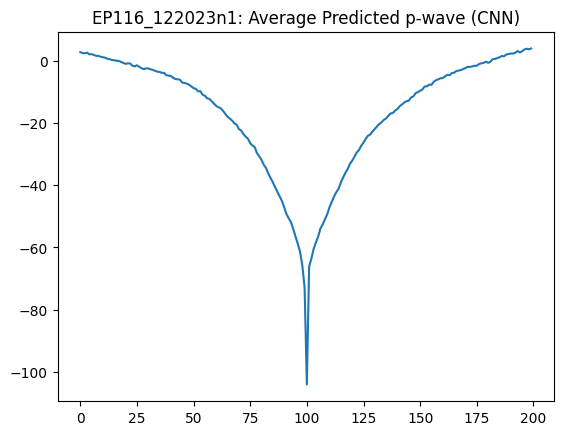

EP118_122023n1: Predicted p-waves saved


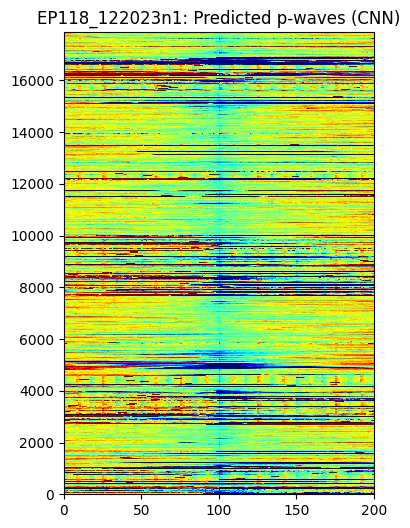

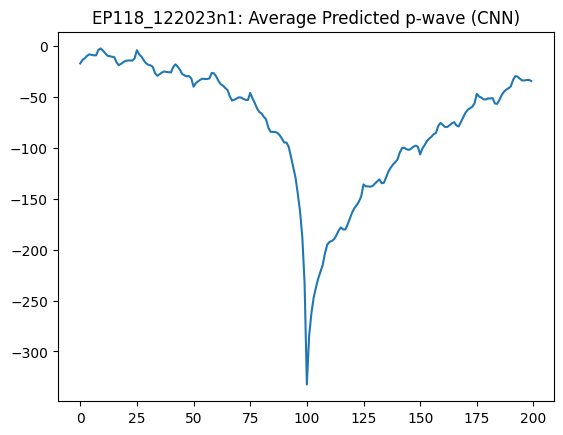

EP117_122023n1: Predicted p-waves saved


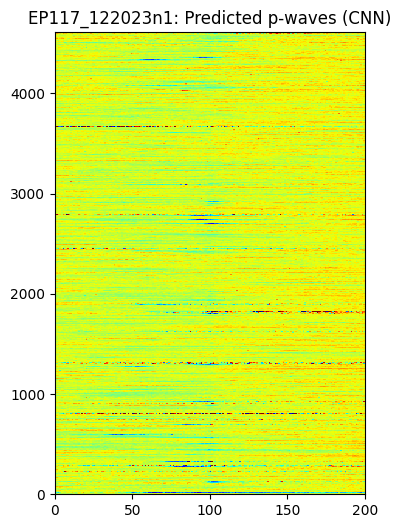

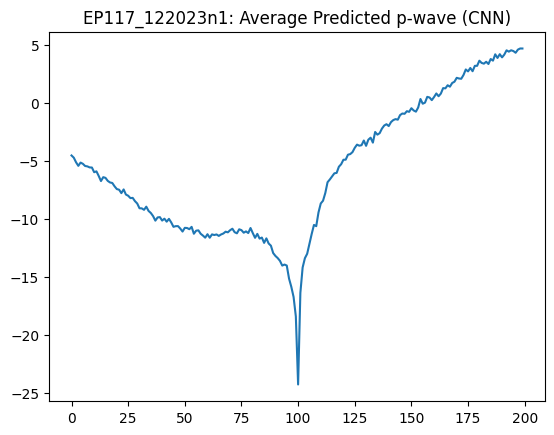

In [ ]:
for i in range(len(test_loaders)):
    pidx_gen = all_pidx_gen[i]
    name = file_names[i]
    lfp_name = 'LFP_raw'
    try:
        LFP = so.loadmat(os.path.join(ppath, name, lfp_name + '.mat'), squeeze_me=True)[lfp_name]
    except:
        lfp_name = 'LFP'
        LFP = so.loadmat(os.path.join(ppath, name, lfp_name + '.mat'), squeeze_me=True)[lfp_name]

    # get all P-waves:
    iwin2 = 100

    data = []
    peaks = []
    for i in pidx_gen:
        peaks.append(LFP[i])
        if i >= iwin2 and i+iwin2 < LFP.shape[0]:
            tmp = LFP[i-iwin2:i+iwin2]
            data.append(tmp)

    pwaves = np.array(data)

    # Show p-waves as heatmap and average in line plot
    #plt.imshow(pwaves, cmap='jet')
    plt.figure(figsize=(4,6))
    plt.pcolormesh(pwaves, cmap='jet', vmin = -250, vmax = 150)
    plt.title(name + ": Predicted p-waves (CNN)")
    #save image to folder
    file_path = os.path.join(ppath, name, 'predicted_pwaves_cnn.jpg')
    plt.savefig(file_path)
    plt.figure()
    plt.title(name + ": Average Predicted p-wave (CNN)")
    plt.plot(pwaves[:,:].mean(axis=0))
    file_path = os.path.join(ppath, name, 'average_prediction_cnn.jpg')
    plt.savefig(file_path)
    print(name + ': Predicted p-waves saved')
    plt.show()
    plt.close()

# LSTM Model

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split

test_loaders = []
for i in range(len(all_test_data)):
    test_data = all_test_data[i]
    test_target = all_test_target[i]
    X_test_tensor = torch.tensor(test_data, dtype=torch.float32)
    X_test_tensor = X_test_tensor.unsqueeze(-1)
    y_test_tensor = torch.tensor(test_target, dtype=torch.float32).view(-1, 1)
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
    test_loaders.append(test_loader)

In [ ]:
import torch
import torch.nn as nn

class BiLSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, dropout):
        super(BiLSTMModel, self).__init__()

        # Define the LSTM layers
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers=num_layers,
                            batch_first=True, bidirectional=True, dropout=dropout)

        # Define a fully connected (dense) layer
        self.fc = nn.Linear(hidden_size * 2, 1)  # hidden_size * 2 because of bidirectionality

        # Sigmoid layer for binary classification
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # Pass input through LSTM layers
        lstm_out, _ = self.lstm(x)  # lstm_out shape: (batch_size, seq_len, hidden_size * 2)

        # Use the output from the last time step for the fully connected layer
        last_time_step_output = lstm_out[:, -1, :]

        # Pass the last time step output through the fully connected layer
        fc_output = self.fc(last_time_step_output)

        # Apply the sigmoid activation to get probabilities
        output = self.sigmoid(fc_output)

        return output


# Define model parameters
input_size = 1    # Number of features in the input
hidden_size = 50   # Number of hidden units in the LSTM
output_size = 1    # Number of classes or output size
num_layers = 2     # Number of LSTM layers
dropout = 0.3      # Dropout rate

# Instantiate the model, define the loss function and the optimizer
model = BiLSTMModel(input_size, hidden_size, output_size, dropout)
device = torch.device('cpu')
model.to(device)
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [ ]:
#Load the model
file_path = os.path.join(ppath, 'lstm_pwave_extended.pth')
model.load_state_dict(torch.load(file_path))
model.eval()

for i in range(len(test_loaders)):
    test_loader = test_loaders[i]
    name = file_names[i]
    test_loss = 0.0
    predictions = []
    true_labels = []

    with torch.no_grad():
        for X_batch, y_batch in test_loader:
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            test_loss += loss.item() * X_batch.size(0)

            binary_predictions = (outputs.squeeze() > 0.5).float()
            if binary_predictions.dim() == 0:
                predictions.append(binary_predictions.item())
            else:
                predictions.extend(binary_predictions.tolist())

            y = [y[0].item() for y in y_batch]
            true_labels.extend(y)

    test_loss /= len(test_loader.dataset)
    predictions = np.array(predictions)
    true_labels = np.array(true_labels)
    print(name + ':')
    print(f'Test Loss: {test_loss:.4f}')
    print(f'Average Prediction Accuracy: {np.sum(predictions == true_labels) / len(predictions):.4f}')

    test_data = all_test_data[i]
    pidx_gen = []

    for i in range(len(predictions)):
        if predictions[i] == 1:
          test_window = test_data[i]
          num = iwin * i
          minpos = np.argmin(test_window)
          pidx_gen.append(num + minpos)

    pidx_gen = np.array(pidx_gen)

    pwave_dict = so.loadmat(os.path.join(ppath, name, 'p_idx.mat'), squeeze_me=True)
    pidx = pwave_dict['p_idx']

    #write to file
    pwave_dict['p_idx'] = pidx_gen
    so.savemat(os.path.join(ppath, name, 'p_idx_lstm.mat'), pwave_dict)
    total = 0
    k = 0
    for i in range(len(pidx_gen)):
      while k < len(pidx) and pidx[k] <= pidx_gen[i] + 10:
        k += 1
      if k > 0:
        temp = pidx[k - 1]
        if temp > pidx_gen[i] - 10:
          total += 1

    total /= len(pidx_gen)
    within_10 = count_within_10ms(pidx_gen, pidx)
    within_10 /= len(pidx_gen)
    # Print the results
    print(name + ':')
    print(f'Test Loss: {test_loss:.4f}')
    print(f'True Positives: {total:.4f}')
    print(f'Accuracy of predicted p-waves within 10ms: {within_10:.4f}')
    calc_acc = calculate_accuracy(pidx_gen, pidx)
    print(f'Calculated accuracy of predicted p-waves: {calc_acc:.4f}')
    print()
    print(name + " saved")
    print()

EP031_032923n1:
Test Loss: 0.6690
Average Prediction Accuracy: 0.6945
Average Recall: 0.0017
EP031_032923n1 saved

EP88_101023n1:
Test Loss: 0.2443
Average Prediction Accuracy: 0.9364
Average Recall: 0.0000
EP88_101023n1 saved

EP90_101023n1:
Test Loss: 0.4698
Average Prediction Accuracy: 0.8039
Average Recall: 0.0020
EP90_101023n1 saved

EP90_101123n1:
Test Loss: 0.3985
Average Prediction Accuracy: 0.8374
Average Recall: 0.0014
EP90_101123n1 saved

EP90_101223n1:
Test Loss: 0.6858
Average Prediction Accuracy: 0.7007
Average Recall: 0.0015
EP90_101223n1 saved

EP109_012524n1:
Test Loss: 0.3524
Average Prediction Accuracy: 0.8592
Average Recall: 0.0013
EP109_012524n1 saved

EP112_121423n1:
Test Loss: 0.5534
Average Prediction Accuracy: 0.7547
Average Recall: 0.0025
EP112_121423n1 saved

EP112_121523n1:
Test Loss: 0.5999
Average Prediction Accuracy: 0.7302
Average Recall: 0.0022
EP112_121523n1 saved

EP113_121423n1:
Test Loss: 0.4213
Average Prediction Accuracy: 0.8241
Average Recall: 0.

In [ ]:
all_pidx_gen = []
for i in range(len(test_loaders)):
    #generates pidx within test_data
    predictions = all_predictions[i]
    test_data = all_test_data[i]
    name = file_names[i]

    pidx_gen = []

    for i in range(len(predictions)):
        if predictions[i] == 1:
          test_window = test_data[i]
          num = iwin * i
          minpos = np.argmin(test_window)
          pidx_gen.append(num + minpos)

    pidx_gen = np.array(pidx_gen)
    all_pidx_gen.append(pidx_gen)

    #write to file
    pwave_dict['p_idx'] = pidx_gen
    so.savemat(os.path.join(ppath, name, 'p_idx_lstm.mat'), pwave_dict)
    print(name + ' saved')

EP031_032923n1 saved
EP88_101023n1 saved
EP90_101023n1 saved
EP90_101123n1 saved
EP90_101223n1 saved
EP109_012524n1 saved
EP112_121423n1 saved
EP112_121523n1 saved
EP113_121423n1 saved
EP113_121523n1 saved
EP114_121423n1 saved
EP114_121523n1 saved
EP115_010324n1 saved
EP030_032923n1 saved
EP132_022124n1 saved
EP159_051024n1 saved
EP116_122023n1 saved
EP118_122023n1 saved
EP117_122023n1 saved


In [ ]:
all_pidx_gen = []
for i in range(len(test_loaders)):
    #generates pidx within test_data
    predictions = all_predictions[i]
    test_data = all_test_data[i]
    name = file_names[i]

    pidx_gen = []

    for i in range(len(predictions)):
        if predictions[i] == 1:
          test_window = test_data[i]
          num = iwin * i
          minpos = np.argmin(test_window)
          pidx_gen.append(num + minpos)

    pidx_gen = np.array(pidx_gen)
    all_pidx_gen.append(pidx_gen)

    pwave_dict = so.loadmat(os.path.join(ppath, name, 'p_idx.mat'), squeeze_me=True)
    pidx = pwave_dict['p_idx']
    total = 0
    k = 0
    for i in range(len(pidx_gen)):
      while k < len(pidx) and pidx[k] <= pidx_gen[i] + 10:
        k += 1
      if k > 0:
        temp = pidx[k - 1]
        if temp > pidx_gen[i] - 10:
          total += 1

    total /= len(pidx_gen)

    #write to file
    pwave_dict['p_idx'] = pidx_gen
    so.savemat(os.path.join(ppath, name, 'p_idx_cnn.mat'), pwave_dict)

    M = sleepy.load_stateidx(ppath, name)[0]
    seq = sleepy.get_sequences(np.where(M == 1)[0])

    # go through each REM sleep episode:
    #for s in seq:
    all_hits = []
    actual_rem_pidx = []

    for s in seq:
      si = s[0]*nbin
      sj = s[-1]*nbin+1
      hits = np.where((pidx_gen >= si) & (pidx_gen < sj))[0]
      indices = [pidx_gen[i] for i in hits]
      all_hits.extend(indices)
      hits = np.where((pidx >= si) & (pidx < sj))[0]
      indices = [pidx[i] for i in hits]
      actual_rem_pidx.extend(indices)

    within_10 = count_within_10ms(pidx_gen, pidx)
    within_10 /= len(pidx_gen)

    rem_within_10 = count_within_10ms(all_hits, actual_rem_pidx)
    rem_within_10 /= len(all_hits)


    # Print the results
    print(name + ':')
    print(f'True positives: {within_10:.4f}')
    calc_acc = calculate_accuracy(pidx_gen, pidx)
    print(f'Accuracy: {calc_acc:.4f}')
   # print('REM only:')
    print(f'REM True positives: {rem_within_10:.4f}')
    calc_acc_rem = calculate_accuracy(all_hits, pidx)
    print(f'REM Accuracy: {calc_acc_rem:.4f}')
    print()
  #  print(name + " saved")

EP031_032923n1:
True positives: 0.1130
Accuracy: 0.1114
REM True positives: 0.3278
REM Accuracy: 0.1243

EP88_101023n1:
True positives: 0.3617
Accuracy: 0.2234
REM True positives: 0.7378
REM Accuracy: 0.0259

EP90_101023n1:
True positives: 0.1501
Accuracy: 0.1388
REM True positives: 0.4391
REM Accuracy: 0.1045

EP90_101123n1:
True positives: 0.2015
Accuracy: 0.1851
REM True positives: 0.4769
REM Accuracy: 0.1542

EP90_101223n1:
True positives: 0.1117
Accuracy: 0.1077
REM True positives: 0.3978
REM Accuracy: 0.1605

EP109_012524n1:
True positives: 0.2779
Accuracy: 0.2480
REM True positives: 0.5458
REM Accuracy: 0.0734

EP112_121423n1:
True positives: 0.2562
Accuracy: 0.2267
REM True positives: 0.5486
REM Accuracy: 0.1390

EP112_121523n1:
True positives: 0.1394
Accuracy: 0.1314
REM True positives: 0.4192
REM Accuracy: 0.1268

EP113_121423n1:
True positives: 0.1671
Accuracy: 0.1454
REM True positives: 0.5782
REM Accuracy: 0.1836

EP113_121523n1:
True positives: 0.0467
Accuracy: 0.0459
REM

EP031_032923n1: Predicted p-waves saved


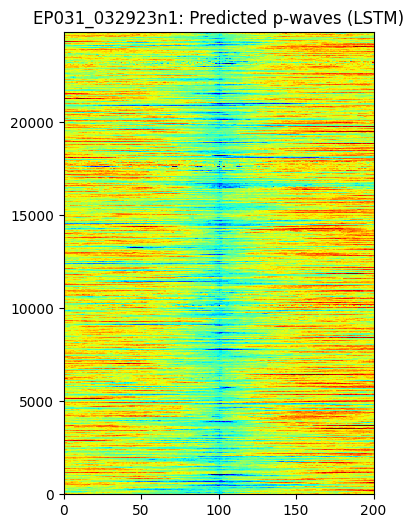

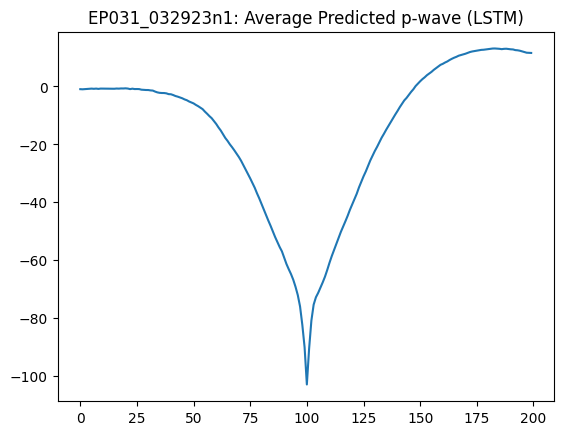

EP88_101023n1: Predicted p-waves saved


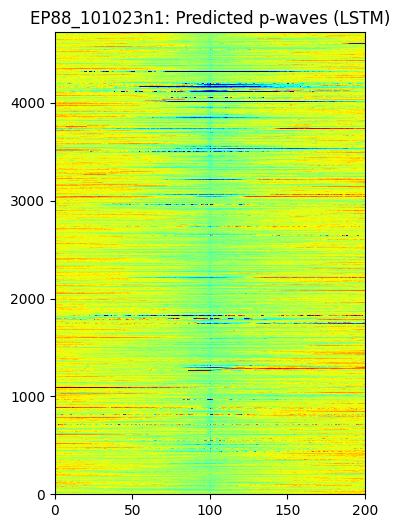

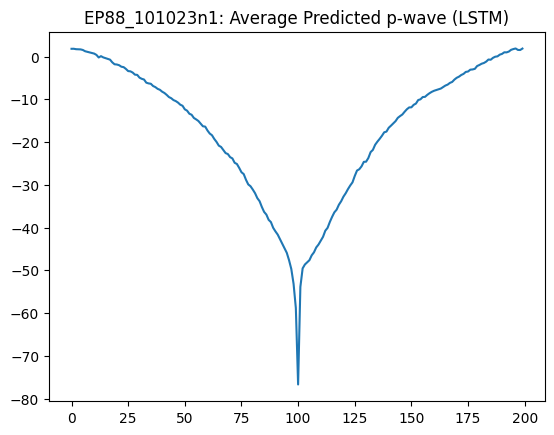

EP90_101023n1: Predicted p-waves saved


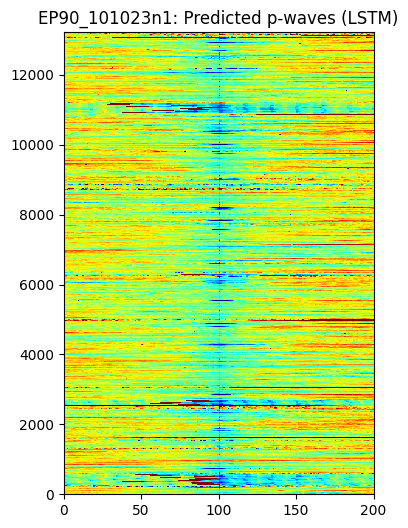

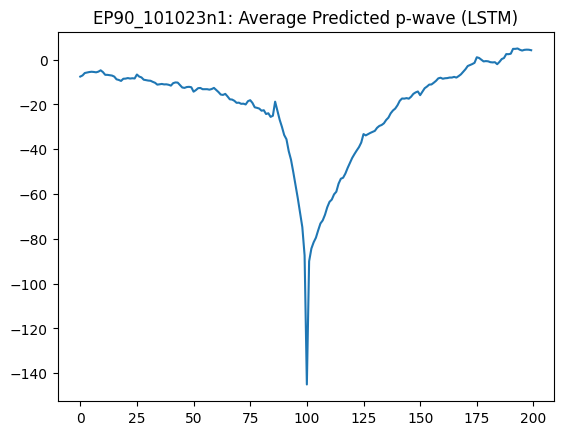

EP90_101123n1: Predicted p-waves saved


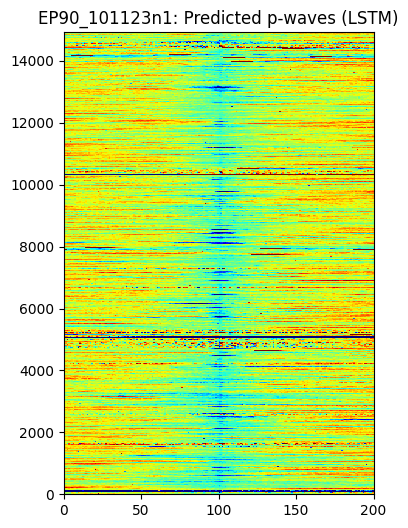

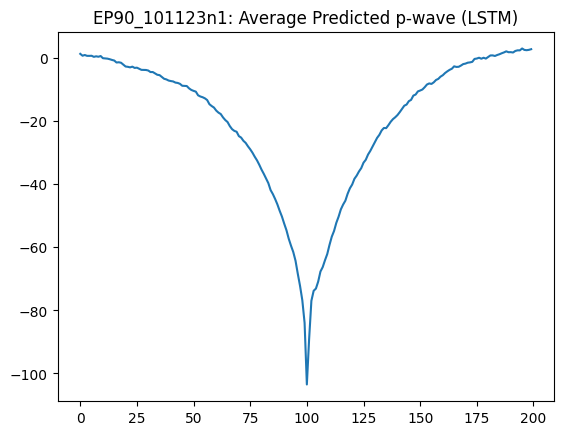

EP90_101223n1: Predicted p-waves saved


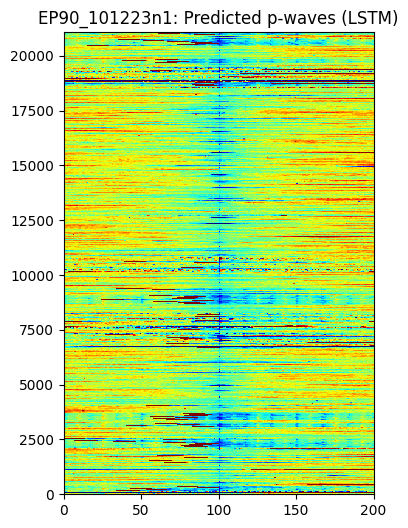

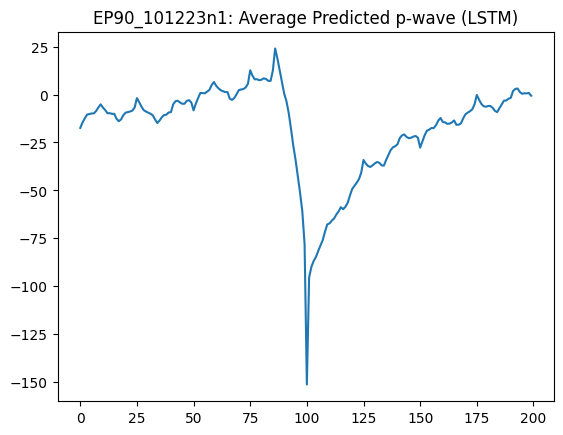

EP109_012524n1: Predicted p-waves saved


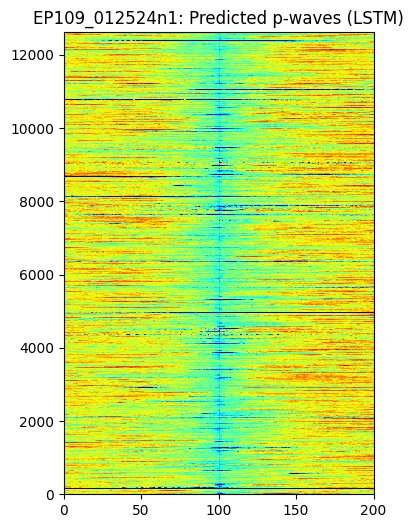

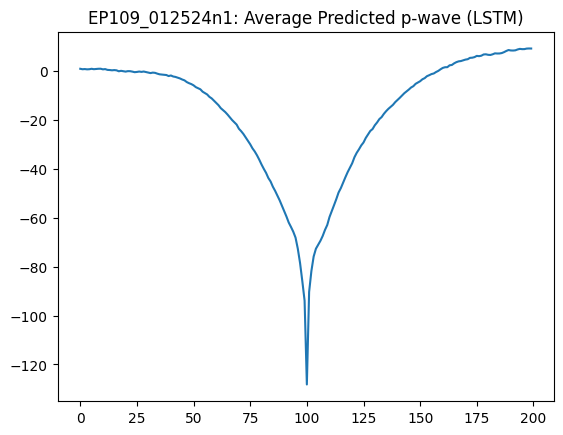

EP112_121423n1: Predicted p-waves saved


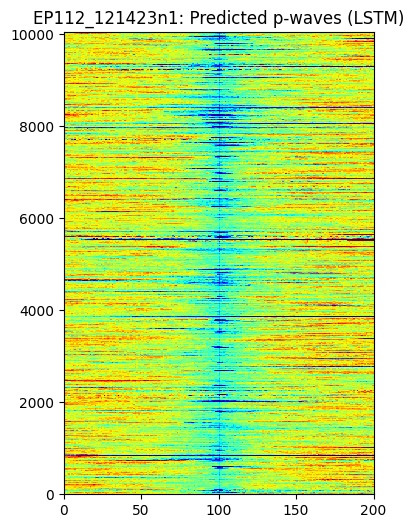

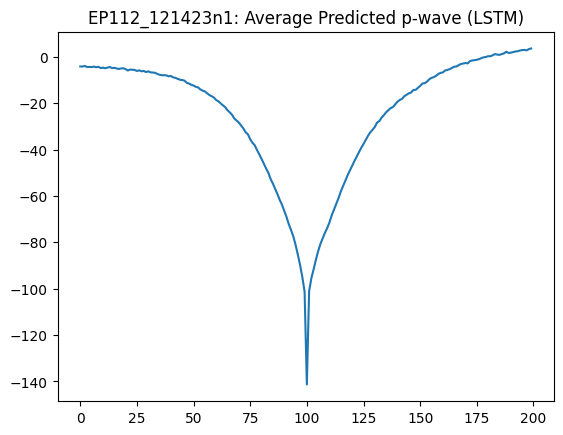

EP112_121523n1: Predicted p-waves saved


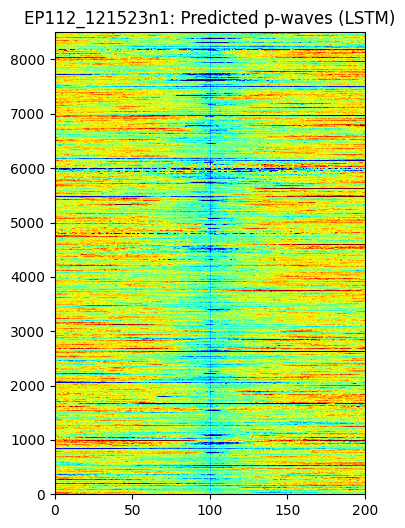

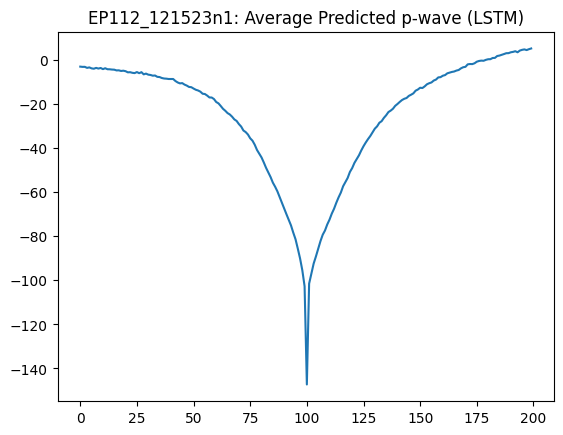

EP113_121423n1: Predicted p-waves saved


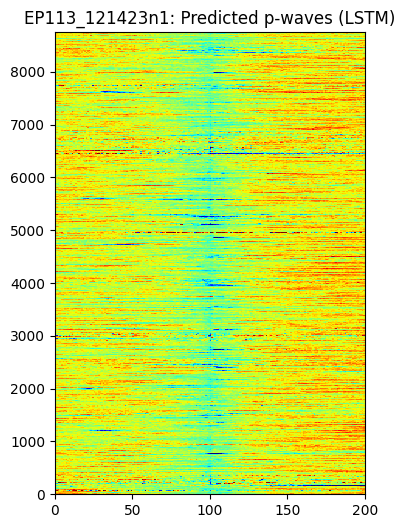

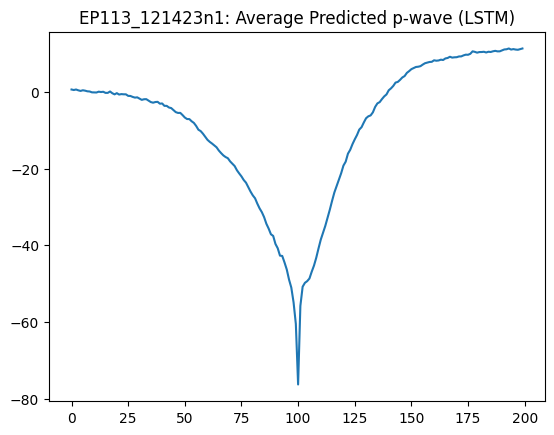

EP113_121523n1: Predicted p-waves saved


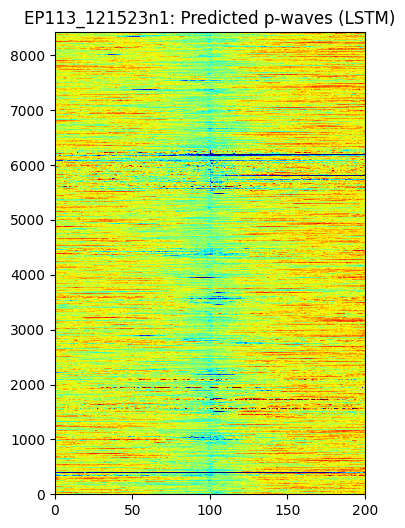

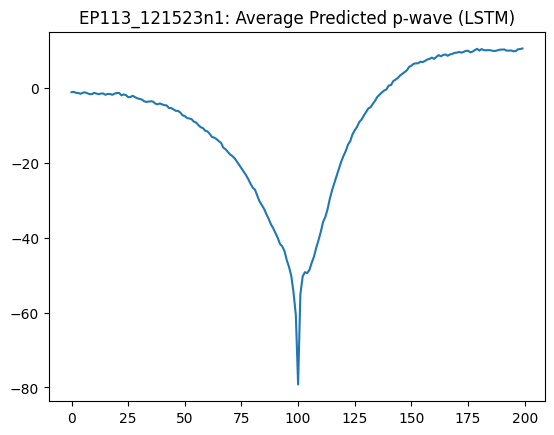

EP114_121423n1: Predicted p-waves saved


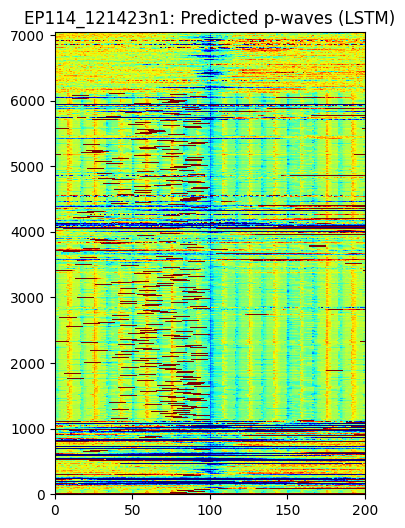

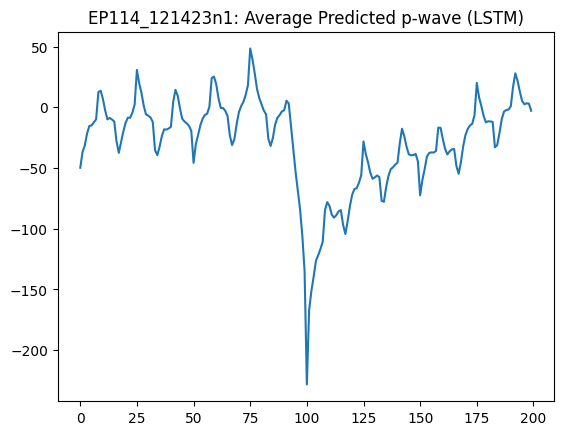

EP114_121523n1: Predicted p-waves saved


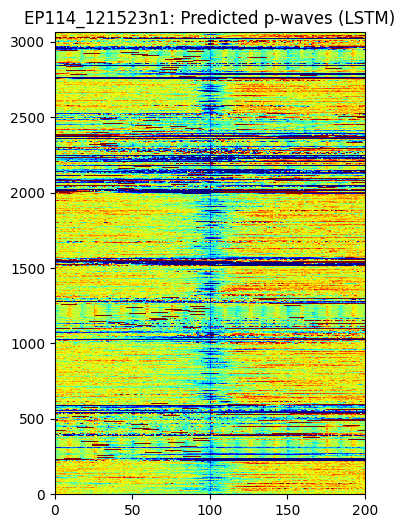

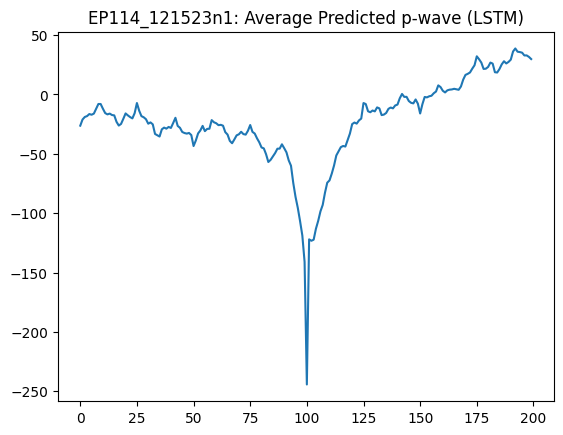

EP115_010324n1: Predicted p-waves saved


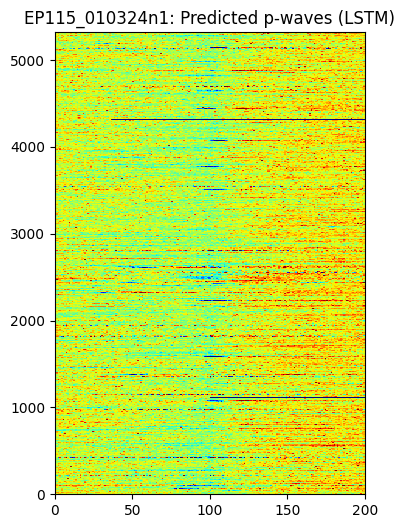

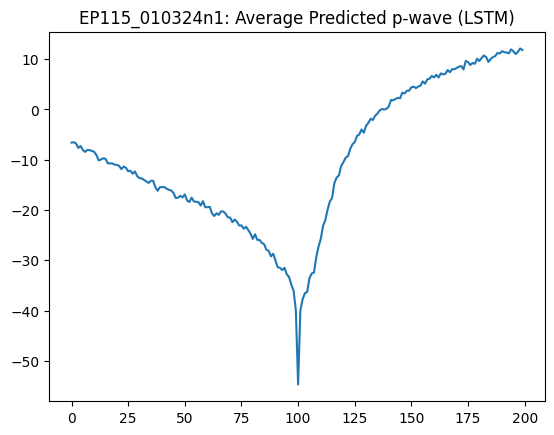

EP030_032923n1: Predicted p-waves saved


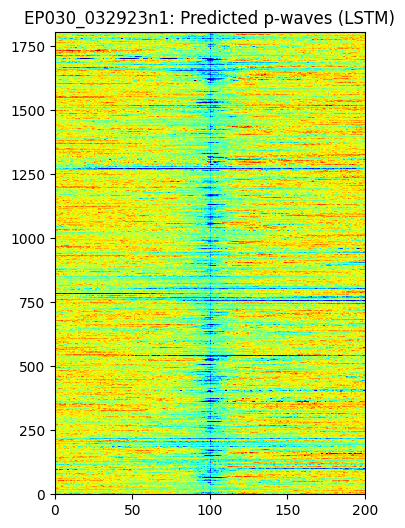

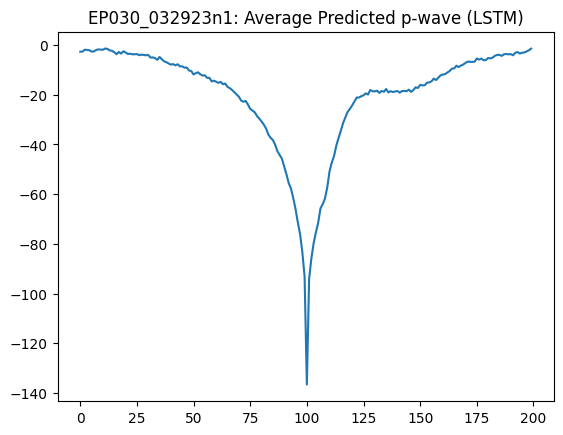

EP132_022124n1: Predicted p-waves saved


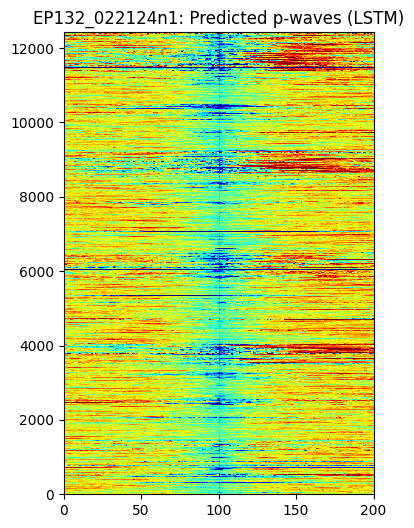

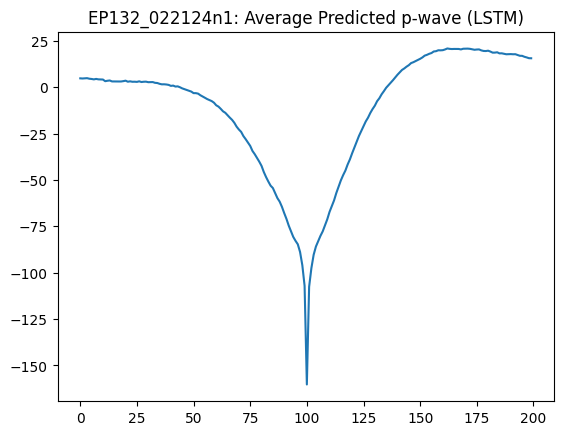

EP159_051024n1: Predicted p-waves saved


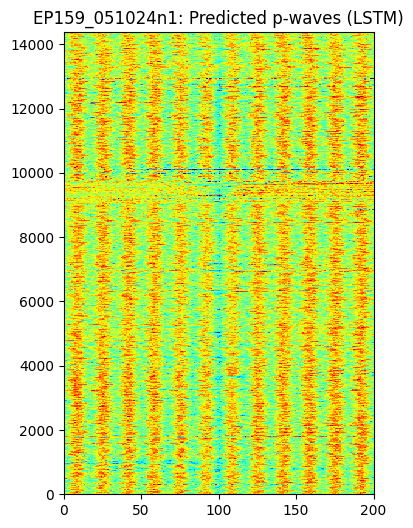

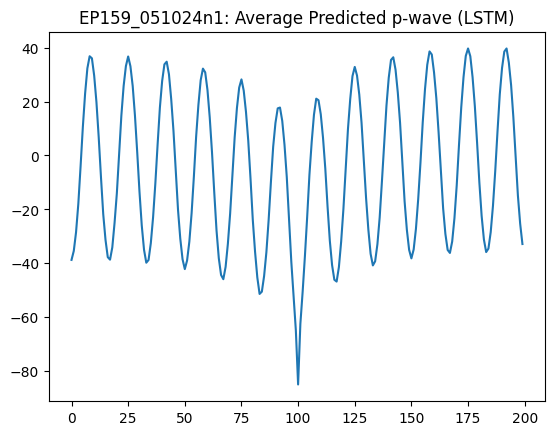

EP116_122023n1: Predicted p-waves saved


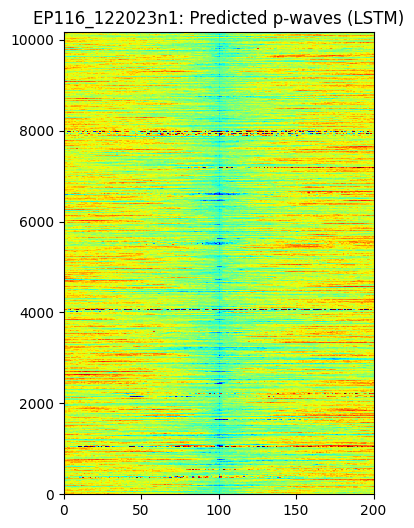

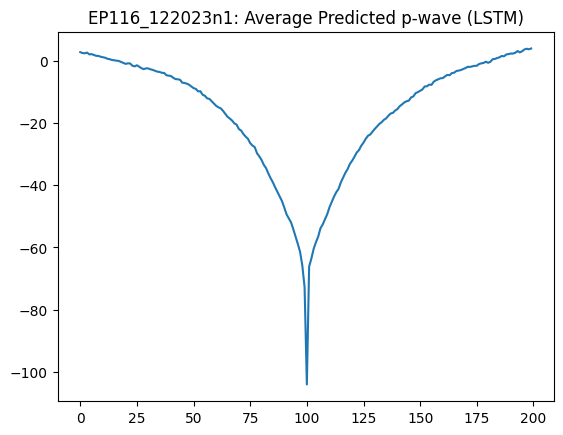

EP118_122023n1: Predicted p-waves saved


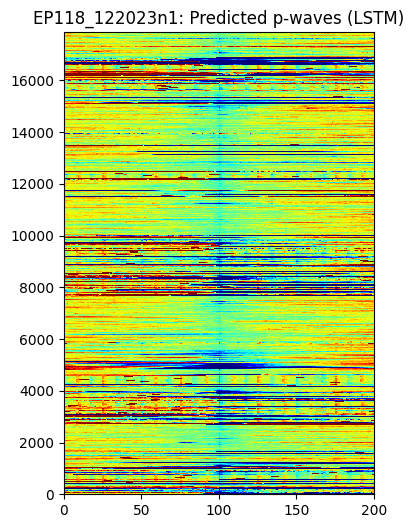

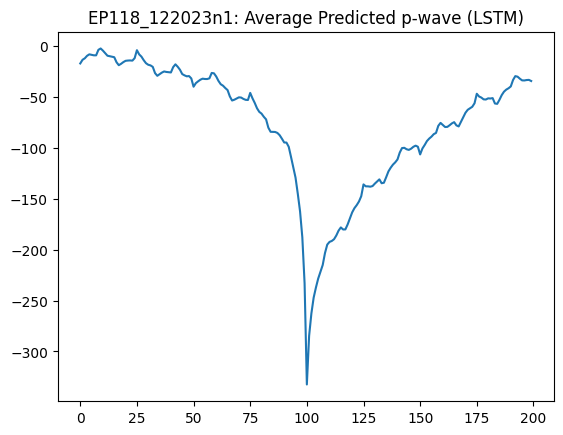

EP117_122023n1: Predicted p-waves saved


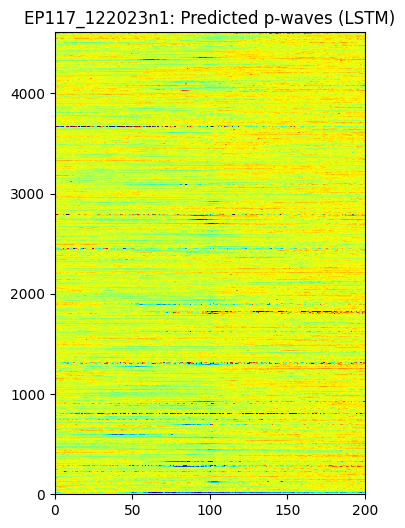

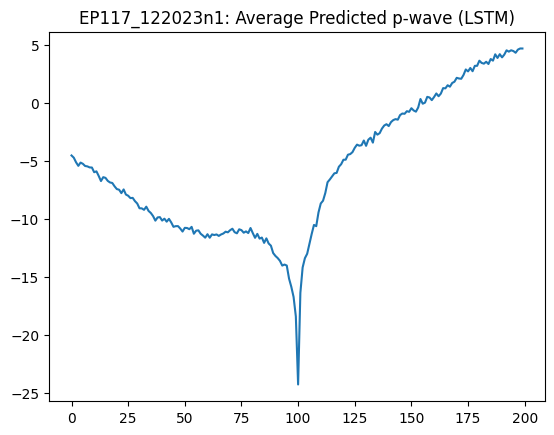

In [ ]:
for i in range(len(test_loaders)):
    pidx_gen = all_pidx_gen[i]
    name = file_names[i]
    lfp_name = 'LFP_raw'
    try:
        LFP = so.loadmat(os.path.join(ppath, name, lfp_name + '.mat'), squeeze_me=True)[lfp_name]
    except:
        lfp_name = 'LFP'
        LFP = so.loadmat(os.path.join(ppath, name, lfp_name + '.mat'), squeeze_me=True)[lfp_name]

    # get all P-waves:
    iwin2 = 100

    data = []
    for i in pidx_gen:
        if i >= iwin2 and i+iwin2 < LFP.shape[0]:
            tmp = LFP[i-iwin2:i+iwin2]
            data.append(tmp)

    pwaves = np.array(data)

    # Show p-waves as heatmap and average in line plot
    #plt.imshow(pwaves, cmap='jet')
    plt.figure(figsize=(4,6))
    plt.pcolormesh(pwaves, cmap='jet', vmin = -250, vmax = 150)
    plt.title(name + ": Predicted p-waves (LSTM)")
    file_path = os.path.join(ppath, name, 'predicted_pwaves_lstm.jpg')
    plt.savefig(file_path)
    plt.figure()
    plt.title(name + ": Average Predicted p-wave (LSTM)")
    plt.plot(pwaves[:,:].mean(axis=0))
    #save the figure to drive folder
    file_path = os.path.join(ppath, name, 'average_prediction_lstm.jpg')
    plt.savefig(file_path)
    print(name + ': Predicted p-waves saved')
    plt.show()
    plt.close()